In [1]:
import sys
sys.path.append("..")

from pathlib import Path
import numpy as np
import pandas as pd
import geopandas as gpd
import plotly.express as px
import plotly.figure_factory as ff
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from ETL.common import execute_query
from fitter import Fitter
import scipy.stats as stats
from sdv.evaluation.single_table import run_diagnostic, evaluate_quality
from sdv.metadata import Metadata
from sdv.single_table import CTGANSynthesizer
from sklearn.cluster import DBSCAN
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KernelDensity

C:\Users\jcf\AppData\Roaming\Python\Python311\site-packages\matplotlib\projections\__init__.py:63: UserWarning: Unable to import Axes3D. This may be due to multiple versions of Matplotlib being installed (e.g. as a system package and as a pip package). As a result, the 3D projection is not available.
  warnings.warn("Unable to import Axes3D. This may be due to multiple versions of "


In [2]:
force_generate_model = False

In [3]:
q = "SELECT * FROM houses_clean ORDER BY timestamp DESC"
df_raw = execute_query(q)

In [4]:
df = df_raw.copy()

In [5]:
loudness_df = gpd.read_file("2017_isofones_total_lden_mapa_estrategic_soroll_bcn.gpkg",
                     layer="2017_Isofones_Total_Lden_Mapa_Estrategic_Soroll_BCN")
loudness_df = loudness_df.to_crs(epsg=4326)

In [6]:
df = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.longitude, df.latitude), crs="EPSG:4326")
df = df.sjoin(loudness_df, how="left")
df = df[df.columns.difference(["fid", "index_right"])]
df = df.rename(columns={"Rang": "loudness"})

In [7]:
cat_cols = ["active", "city", "type", "orientation", "age", "parking", "floor", 
            "elevator", "furniture", "state", "heating", "water_heating", 
            "formatted_address", "pets", "loudness"]
num_cols = ["price", "rooms", "bathrooms", "surface", "latitude", "longitude"]

plot_cols = cat_cols + num_cols

for c in cat_cols:
    df[c] = df[c].fillna("Null")
    if c == "age":
        df[c] = pd.Categorical(df[c], ["Null", "Menos de 1 año", "1 a 5 años", "5 a 10 años", "10 a 20 años", 
                                       "20 a 30 años", "30 a 50 años", "70 a 100 años", "+ 100 años"])
    elif c == "floor":
        df[c] = pd.Categorical(df[c], ["Null", "Sótano", "Otro", "Bajos", "Entresuelo", "1ª planta", "2ª planta",
                                       "3ª planta", "4ª planta", "5ª planta", "6ª planta", "7ª planta", 
                                       "8ª planta", "9ª planta", "10ª planta",  "11ª planta", "12ª planta",
                                       "13ª planta", "14ª planta", "A partir de la 15ª planta"])
    elif c == "orientation":
        df[c] = pd.Categorical(df[c], ["Null", "Este", "Noreste", "Norte", "Noroeste", "Oeste", "Suroeste", "Sur", "Sureste"])
    else:
        df[c] = pd.Categorical(df[c])

group_cols = [e for e in cat_cols if e not in ("active", "formatted_address")]

In [8]:
for c in plot_cols:    
    if c not in ("formatted_address"):
        fig = px.histogram(df[c].sort_values())
        fig.show()

In [9]:
clean_lats = df.latitude.dropna().values
clean_lons = df.longitude.dropna().values

df_geo = pd.DataFrame({"Latitude": clean_lats, "Longitude": clean_lons})
df_geo_price = pd.DataFrame({"Latitude": clean_lats,
                       "Longitude": clean_lons,
                      "price": df[df["latitude"].notna()].price.values})
df_geo_emissions = pd.DataFrame({"Latitude": clean_lats,
                       "Longitude": clean_lons,
                      "emissions": df[df["latitude"].notna()].emissions.values})
df_geo_energy = pd.DataFrame({"Latitude": clean_lats,
                       "Longitude": clean_lons,
                      "energy": df[df["latitude"].notna()].energy.values})

In [10]:
fig_count = px.density_map(df_geo, lat='Latitude', lon='Longitude', 
                        radius=15)
fig_price = px.density_map(df_geo_price, lat='Latitude', lon='Longitude', z="price",
                        radius=15)
fig_emissions = px.density_map(df_geo_emissions, lat='Latitude', lon='Longitude', z="emissions",
                        radius=15)
fig_energy = px.density_map(df_geo_energy, lat='Latitude', lon='Longitude', z="energy",
                        radius=15)

In [11]:
fig = make_subplots(rows=1, cols=2, 
                    specs=[[{'type': 'map'}, {'type': 'map'}]], 
                    subplot_titles=("Count", "Price"))

for trace_c in fig_count.data:
    trace_c['coloraxis'] = 'coloraxis1'
    fig.add_trace(trace_c, row=1, col=1)

for trace_p in fig_price.data:
    trace_p['coloraxis'] = 'coloraxis2'
    fig.add_trace(trace_p, row=1, col=2)

fig.update_layout(
    height=700,
    coloraxis1=dict(colorscale='Viridis', colorbar=dict(title="Count", x=0.45)),
    coloraxis2=dict(colorscale='Plasma', colorbar=dict(title="Price", x=1.0)),
)
fig.update_maps(style='open-street-map', zoom=8, center=dict(lat=df_geo.Latitude.mean(), 
                                    lon=df_geo.Longitude.mean()))

fig.show()

In [12]:
fig = make_subplots(rows=1, cols=2, 
                    specs=[[{'type': 'map'}, {'type': 'map'}]], 
                    subplot_titles=("Emissions", "Energy"))

for trace in fig_emissions.data:
    trace['coloraxis'] = 'coloraxis1'
    fig.add_trace(trace, row=1, col=1)

for trace in fig_energy.data:
    trace['coloraxis'] = 'coloraxis2'
    fig.add_trace(trace, row=1, col=2)

fig.update_layout(
    height=700,
    coloraxis1=dict(colorscale='Viridis', colorbar=dict(title="Emissions", x=0.45)),
    coloraxis2=dict(colorscale='Plasma', colorbar=dict(title="Energy", x=1.0)),
)
fig.update_maps(style='open-street-map', zoom=8, center=dict(lat=df_geo.Latitude.mean(), 
                                    lon=df_geo.Longitude.mean()))

fig.show()

<Axes: >

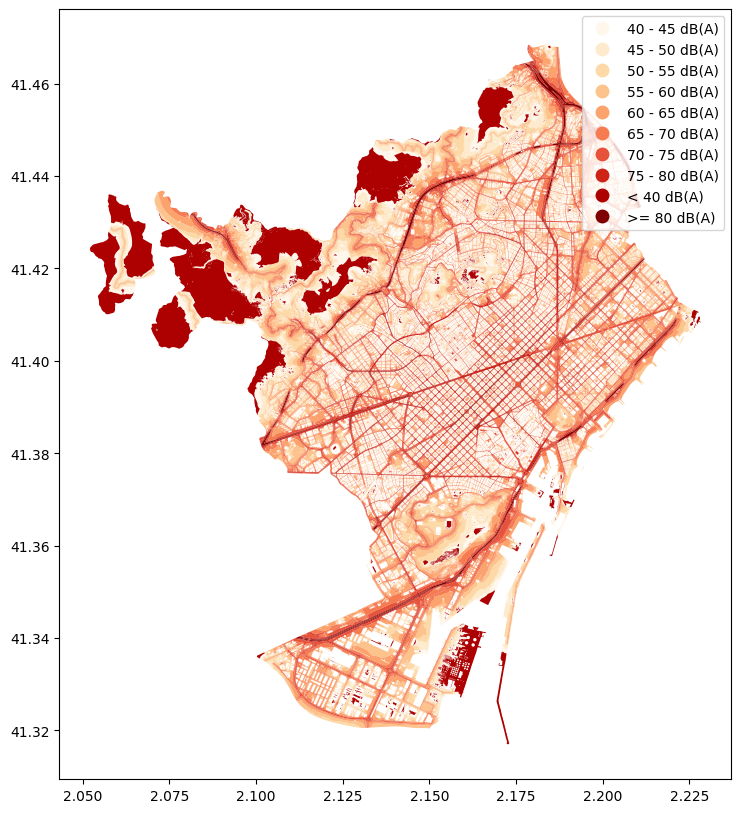

In [13]:
loudness_df.plot(column="Rang", legend=True, figsize=(20, 10), cmap='OrRd')

In [14]:
original_data = df.copy()[group_cols+num_cols]

for c in cat_cols:
    if c in original_data.columns:
        original_data[c] = original_data[c].astype(object)

try:
    if force_generate_model:
        raise FileNotFoundError
    metadata = Metadata.load_from_json("metadata_ctgan.json")
except FileNotFoundError:
    metadata = Metadata.detect_from_dataframe(
        data=original_data,
        table_name='houses')
    metadata_json = Path("metadata_ctgan.json")
    metadata_json.unlink()
    metadata.save_to_json("metadata_ctgan.json")

try:
    if force_generate_model:
        raise FileNotFoundError
    synthesizer = CTGANSynthesizer.load("CTGANSynthesizer.pkl")
except FileNotFoundError:
    synthesizer = CTGANSynthesizer(metadata, locales=["es_ES"])
    synthesizer.fit(original_data)
    model_file = Path("CTGANSynthesizer.pkl")
    model_file.unlink()
    synthesizer.save("CTGANSynthesizer.pkl")

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\rdt\transformers\pii\anonymizer.py:102: UserWarning:

Locales ['es_ES'] do not support provider 'geo' and function 'latitude'.
In place of these locales, 'en_US' will be used instead. Please refer to the localized provider docs for more information: https://faker.readthedocs.io/en/master/locales.html

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\rdt\transformers\pii\anonymizer.py:102: UserWarning:

Locales ['es_ES'] do not support provider 'geo' and function 'longitude'.
In place of these locales, 'en_US' will be used instead. Please refer to the localized provider docs for more information: https://faker.readthedocs.io/en/master/locales.html

  File "C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\joblib\externals\loky\backend\context.py", line 282, in _count_physical_cores
    raise ValueError(f"found {cpu_count_physical} physical cores < 1")


In [15]:
synthetic_data = synthesizer.sample(num_rows=original_data.shape[0])
synthetic_data["pets"] = synthetic_data["pets"].astype(str).str.lower()
synthetic_data["pets"] = synthetic_data["pets"].str.replace("null", "Null")

In [16]:
diagnostic = run_diagnostic(df[group_cols+num_cols], synthetic_data, metadata)
quality_report = evaluate_quality(df[group_cols+num_cols], synthetic_data, metadata)

Generating report ...

(1/2) Evaluating Data Validity: |███████████████████████████████████████████████████| 19/19 [00:00<00:00, 1024.79it/s]|
Data Validity Score: 98.67%

(2/2) Evaluating Data Structure: |█████████████████████████████████████████████████████| 1/1 [00:00<00:00, 333.81it/s]|
Data Structure Score: 18.75%

Overall Score (Average): 58.71%

Generating report ...

(1/2) Evaluating Column Shapes: |████████████████████████████████████████████████████| 19/19 [00:00<00:00, 322.82it/s]|
Column Shapes Score: 88.21%

(2/2) Evaluating Column Pair Trends: |█████████████████▊                            | 66/171 [00:00<00:00, 248.73it/s]|

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:47: RuntimeWarning:

The values in the array are unorderable. Pass `sort=False` to suppress this warning.

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:47: RuntimeWarning:

The values in the array are unorderable. Pass `sort=False` to suppress this warning.

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:47: RuntimeWarning:

The values in the array are unorderable. Pass `sort=False` to suppress this warning.



(2/2) Evaluating Column Pair Trends: |██████████████████████████████▌              | 116/171 [00:00<00:00, 224.04it/s]|

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:47: RuntimeWarning:

The values in the array are unorderable. Pass `sort=False` to suppress this warning.

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:47: RuntimeWarning:

The values in the array are unorderable. Pass `sort=False` to suppress this warning.

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:47: RuntimeWarning:

The values in the array are unorderable. Pass `sort=False` to suppress this warning.

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:47: RuntimeWarning:

The values in the array are unorderable. Pass `sort=False` to suppress this warning.



(2/2) Evaluating Column Pair Trends: |█████████████████████████████████████████████| 171/171 [00:00<00:00, 253.45it/s]|
Column Pair Trends Score: 76.88%

Overall Score (Average): 82.55%



C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:47: RuntimeWarning:

The values in the array are unorderable. Pass `sort=False` to suppress this warning.

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:47: RuntimeWarning:

The values in the array are unorderable. Pass `sort=False` to suppress this warning.

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:47: RuntimeWarning:

The values in the array are unorderable. Pass `sort=False` to suppress this warning.

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:47: RuntimeWarning:

The values in the array are unorderable. Pass `sort=False` to suppress this warning.

C:\Users\jcf\AppData\Local\Programs\Python\P

In [17]:
synthetic_data.head(5)

,city,type,orientation,age,parking,floor,elevator,furniture,state,heating,water_heating,pets,loudness,price,rooms,bathrooms,surface,latitude,longitude
0,Murcia,Piso,Oeste,+ 100 años,Privado,Null,true,false,Las Palmas,Null,Gas Natural,Null,Null,1484.0,4.0,3.0,66.0,-53.438614,123.044669
1,Huelva,Apartamento,Sur,+ 100 años,Null,Entresuelo,true,true,León,Null,Null,Null,>= 80 dB(A),1211.0,2.0,1.0,114.0,-9.691266,-124.528385
2,Jaén,Piso,Este,NaN,Null,1ª planta,true,true,Las Palmas,Electricidad,Electricidad,Null,Null,1112.0,2.0,1.0,73.0,38.074495,44.585863
3,Barcelona,Apartamento,Null,Null,Null,8ª planta,true,true,Toledo,Null,Null,Null,Null,1796.0,1.0,2.0,92.0,-5.305181,174.657232
4,Albacete,Piso,Sur,Menos de 1 año,Null,Entresuelo,true,true,Asturias,Null,Solar,Null,Null,1165.0,2.0,1.0,66.0,-59.223313,34.456232


In [18]:
for c in group_cols+num_cols:    
    if c not in ("formatted_address", "active", "city"):
        fig = go.Figure()
        fig.add_trace(go.Histogram(x=synthetic_data[c].sort_values(), name=f"Synthetic {c}"))
        fig.add_trace(go.Histogram(x=df[c].sort_values(), name=f"Real {c}"))
        
        fig.update_layout(
            barmode="overlay",
            yaxis_title_text='%'
        )
        fig.update_traces(opacity=0.5)
        fig.show()

In [19]:
cols = [c for c in group_cols+num_cols if c not in ("city", "state", "lat", "lng")]

diagnostic = run_diagnostic(df[cols], synthetic_data, metadata)
quality_report = evaluate_quality(df[cols], synthetic_data, metadata)

Generating report ...

(1/2) Evaluating Data Validity: |████████████████████████████████████████████████████| 19/19 [00:00<00:00, 891.92it/s]|
Data Validity Score: 98.67%

(2/2) Evaluating Data Structure: |█████████████████████████████████████████████████████| 1/1 [00:00<00:00, 323.29it/s]|
Data Structure Score: 20.0%

Overall Score (Average): 59.34%

Generating report ...

(1/2) Evaluating Column Shapes: |████████████████████████████████████████████████████| 19/19 [00:00<00:00, 232.68it/s]|
Column Shapes Score: 88.21%

(2/2) Evaluating Column Pair Trends: |████████▎                                     | 31/171 [00:00<00:00, 302.23it/s]|

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:47: RuntimeWarning:

The values in the array are unorderable. Pass `sort=False` to suppress this warning.

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:47: RuntimeWarning:

The values in the array are unorderable. Pass `sort=False` to suppress this warning.

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:47: RuntimeWarning:

The values in the array are unorderable. Pass `sort=False` to suppress this warning.



(2/2) Evaluating Column Pair Trends: |████████████████████████████▏                | 107/171 [00:00<00:00, 211.52it/s]|

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:47: RuntimeWarning:

The values in the array are unorderable. Pass `sort=False` to suppress this warning.

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:47: RuntimeWarning:

The values in the array are unorderable. Pass `sort=False` to suppress this warning.

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:47: RuntimeWarning:

The values in the array are unorderable. Pass `sort=False` to suppress this warning.

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:47: RuntimeWarning:

The values in the array are unorderable. Pass `sort=False` to suppress this warning.



(2/2) Evaluating Column Pair Trends: |█████████████████████████████████████████████| 171/171 [00:00<00:00, 238.82it/s]|
Column Pair Trends Score: 76.88%

Overall Score (Average): 82.55%



C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:47: RuntimeWarning:

The values in the array are unorderable. Pass `sort=False` to suppress this warning.

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:47: RuntimeWarning:

The values in the array are unorderable. Pass `sort=False` to suppress this warning.

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:47: RuntimeWarning:

The values in the array are unorderable. Pass `sort=False` to suppress this warning.

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:47: RuntimeWarning:

The values in the array are unorderable. Pass `sort=False` to suppress this warning.

C:\Users\jcf\AppData\Local\Programs\Python\P

In [20]:
probs = {}

for c in group_cols:    
    df_grouped = df.groupby(c).count().reset_index()[[c, "id"]]
    df_grouped[f"prob_{c}"] = 100 * df_grouped["id"] / df_grouped["id"].sum()
    df_grouped = df_grouped[[c, f"prob_{c}"]]
    probs[c] = df_grouped

probs

{'city':                      city  prob_city
 0                  Abrera   0.065459
 1              Aiguafreda   0.021820
 2                  Alella   0.196378
 3           Arenys de Mar   0.349116
 4          Arenys de Munt   0.065459
 ..                    ...        ...
 157   Vilanova del Vallès   0.087279
 158  Vilanova i la Geltrú   0.785512
 159       Vilassar de Mar   0.261837
 160                 Òdena   0.021820
 161                Òrrius   0.021820
 
 [162 rows x 2 columns],
 'type':             type  prob_type
 0    Apartamento  32.926031
 1   Casa adosada   2.094698
 2  Casa o chalet   7.593280
 3         Dúplex   1.723762
 4        Estudio   3.185686
 5  Finca rústica   0.436395
 6           Loft   0.741872
 7           Piso  45.821514
 8    Planta baja   0.960070
 9          Ático   4.516692,
 'orientation':   orientation  prob_orientation
 0        Null         65.502946
 1        Este          4.298494
 2     Noreste          3.403884
 3       Norte          2.923849
 

,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
genhyperbolic,8.169695,1259.507965,1291.598143,inf,0.088162,4.518929e-31
norminvgauss,12.022021,1274.500693,1300.172835,inf,0.090298,1.410514e-32
skewcauchy,12.367942,909.065083,928.319190,inf,0.078392,1.194424e-24
tukeylambda,12.548843,717.632202,736.886309,inf,0.123472,1.270063e-60
cauchy,13.095421,808.666495,821.502566,inf,0.117844,3.033839e-55


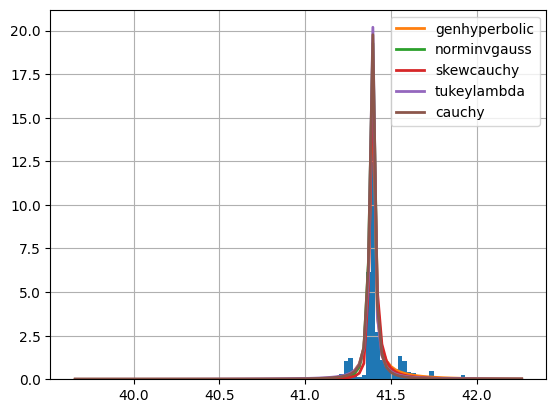

In [21]:
f = Fitter(df.latitude.dropna().values.tolist())
f.fit()
f.summary(Nbest=5)

In [22]:
lats = df.latitude.dropna().values

lat_gennorm_dist = stats.fit(stats.gennorm, lats, {"beta": [0, 20], "scale": [-5, 20], "loc": [0, 100]})
lat_norm_dist = stats.fit(stats.norm, lats, {"scale": [-5, 20], "loc": [0, 100]})

fitter_dist_name =  list(f.get_best().keys())[0]
lat_fitter_dist = getattr(stats, fitter_dist_name)

lat_gennorm_data = [stats.gennorm.rvs(scale=lat_gennorm_dist.params.scale, loc=lat_gennorm_dist.params.loc,
                                  beta=lat_gennorm_dist.params.beta) for i in range(0, len(lats))]
lat_norm_data = [stats.norm.rvs(scale=lat_norm_dist.params.scale, loc=lat_norm_dist.params.loc) for i in range(0, len(lats))]

lat_fitter_data = [lat_fitter_dist.rvs(**list(f.get_best().values())[0]) for i in range(0, len(lats))]

lat_hist_data = [lat_gennorm_data, lat_norm_data, lat_fitter_data, lats]
lat_group_labels = ["Gennorm", "Normal", fitter_dist_name.capitalize(), "Real data"]

fig = ff.create_distplot(lat_hist_data, lat_group_labels, show_hist=False, show_rug=False)
fig.show()

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\stats\_distn_infrastructure.py:2357: RuntimeWarning:

overflow encountered in divide



In [23]:
lons = df.longitude.dropna().values

lon_gennorm_dist = stats.fit(stats.gennorm, lons, {"beta": [0, 20], "scale": [-5, 20], "loc": [0, 100]})
lon_norm_dist = stats.fit(stats.norm, lons, {"scale": [-5, 20], "loc": [0, 100]})

p = list(list(f.get_best().values())[0].keys())
p_range = {k: [-5, 20] for k in p}
lon_fitter_dist = stats.fit(lat_fitter_dist, lons, p_range)

lon_gennorm_data = [stats.gennorm.rvs(scale=lon_gennorm_dist.params.scale, loc=lon_gennorm_dist.params.loc,
                                  beta=lon_gennorm_dist.params.beta) for i in range(0, len(lons))]
lon_norm_data = [stats.norm.rvs(scale=lon_norm_dist.params.scale, loc=lon_norm_dist.params.loc) for i in range(0, len(lons))]

lon_fitter_data = [lat_fitter_dist.rvs(**lon_fitter_dist.params._asdict()) for i in range(0, len(lons))]

lon_hist_data = [lon_gennorm_data, lon_norm_data, lon_fitter_data, lons]
lon_group_labels = ["Gennorm", "Normal", fitter_dist_name.capitalize(), "Real data"]

fig = ff.create_distplot(lon_hist_data, lon_group_labels, show_hist=False, show_rug=False)
fig.show()

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\stats\_continuous_distns.py:10348: RuntimeWarning:

overflow encountered in scalar divide



In [24]:
coords = df_geo.loc[:, ["Latitude", "Longitude"]]

kde = KernelDensity(bandwidth=0.001)
kde.fit(coords)

num_synthetic_points = len(coords) 
kde_data = kde.sample(num_synthetic_points)

In [25]:
dbscan = DBSCAN(eps=0.005, min_samples=1, algorithm='ball_tree', metric='haversine').fit(np.radians(coords))

dbscan_labels = dbscan.fit_predict(coords)
coords["dbscan_labels"] = dbscan_labels

unique_clusters = np.unique(dbscan_labels)

synthetic_latitudes = []
synthetic_longitudes = []

for cluster_id in unique_clusters:
    if cluster_id == -1:
        continue
    
    cluster_data = coords[dbscan_labels == cluster_id]
    
    kde = KernelDensity(bandwidth=0.001)
    kde.fit(cluster_data)
    
    num_synthetic_points = len(cluster_data) 
    synthetic_cluster_data = kde.sample(num_synthetic_points)
    
    synthetic_latitudes.extend(synthetic_cluster_data[:, 0])
    synthetic_longitudes.extend(synthetic_cluster_data[:, 1])

In [26]:
df_geo_synth = pd.DataFrame({"Latitude": lat_fitter_data, "Longitude": lon_fitter_data})

fig = go.Figure()
fig.add_traces([
    go.Scatter(x=df_geo["Latitude"], y=df_geo["Longitude"], name="Real", mode='markers'),
    go.Scatter(x=synthetic_latitudes, y=synthetic_longitudes, name="Clustering + KDE", mode='markers'),
    go.Scatter(x=df_geo_synth["Latitude"], y=df_geo_synth["Longitude"], name=fitter_dist_name.capitalize(), mode='markers'),
    go.Scatter(x=kde_data[0], y=kde_data[1], name="KDE", mode='markers'),
])
fig.show()

In [27]:
def calculate_wasserstein_distance(group_1_data, group_2_data):
    data1 = np.vstack(group_1_data).T
    data2 = np.vstack(group_2_data).T
    distance = stats.wasserstein_distance(data1.flatten(), data2.flatten())

    return distance

In [28]:
data_1 = [df_geo["Latitude"].values, df_geo["Longitude"].values]
data_2 = [synthetic_latitudes, synthetic_longitudes]

distance = calculate_wasserstein_distance(data_1, data_2)
print(f"Wasserstein distance between Original and Clustering+KDE: {distance}")

Wasserstein distance between Original and Clustering+KDE: 0.000494937826506054


In [29]:
data_2 = [df_geo_synth["Latitude"].values, df_geo_synth["Longitude"].values]

distance = calculate_wasserstein_distance(data_1, data_2)
print(f"Wasserstein distance between Original and {fitter_dist_name}: {distance}")

Wasserstein distance between Original and genhyperbolic: 0.02418025629765111


In [30]:
data_2 = [synthetic_data["latitude"].dropna().values, synthetic_data["longitude"].dropna().values]

distance = calculate_wasserstein_distance(data_1, data_2)
print(f"Wasserstein distance between Original and CTGANSynthesizer: {distance}")

Wasserstein distance between Original and CTGANSynthesizer: 54.658204320295944


In [31]:
df_real = df[["latitude", "longitude", "price"]].dropna()
df_real = df_real.rename(columns={"latitude": "Latitude", "longitude": "Longitude"})
df_synth = pd.DataFrame({"Latitude": synthetic_latitudes,
                         "Longitude": synthetic_longitudes, 
                         "price": synthetic_data["price"].sample(len(synthetic_latitudes))})

In [32]:
fig_real = px.density_map(df_real, lat='Latitude', lon='Longitude', z="price",
                        radius=15)
fig_synth = px.density_map(df_synth, lat='Latitude', lon='Longitude', z="price",
                        radius=15)

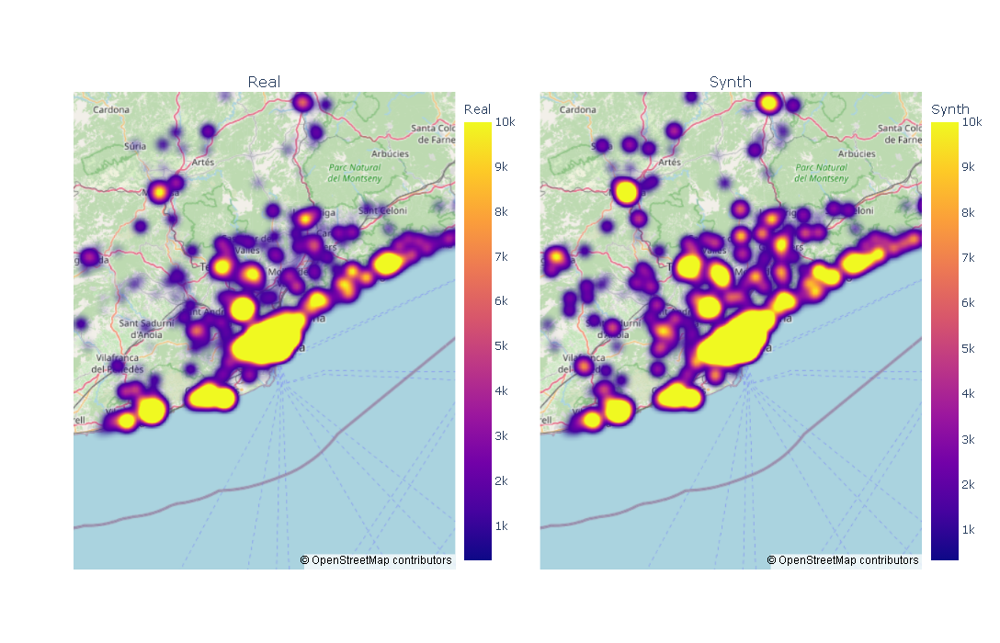

In [33]:
fig = make_subplots(rows=1, cols=2, 
                    specs=[[{'type': 'map'}, {'type': 'map'}]], 
                    subplot_titles=("Real", "Synth"))

for trace in fig_real.data:
    trace['coloraxis'] = 'coloraxis1'
    fig.add_trace(trace, row=1, col=1)

for trace in fig_synth.data:
    trace['coloraxis'] = 'coloraxis2'
    fig.add_trace(trace, row=1, col=2)

fig.update_layout(
    height=700,
    coloraxis1=dict(colorscale='Plasma', colorbar=dict(title="Real", x=0.45)),
    coloraxis2=dict(colorscale='Plasma', colorbar=dict(title="Synth", x=1.0)),
)
fig.update_maps(style='open-street-map', zoom=8, center=dict(lat=df_geo.Latitude.mean(), 
                                    lon=df_geo.Longitude.mean()))

fig.show()

In [34]:
data_1 = [df_real["Latitude"].values, df_real["Longitude"].values, df_real["price"].values]
data_2 = [df_synth["Latitude"].values, df_synth["Longitude"].values, df_synth["price"].values]

distance = calculate_wasserstein_distance(data_1, data_2)
print(f"Wasserstein distance between Original latlon+price and synthetized: {distance}")

Wasserstein distance between Original latlon+price and synthetized: 79.78890475242615


In [35]:
# from geopy.geocoders import Nominatim

# geolocator = Nominatim(timeout=3, user_agent="test_geo")

# location = [synthetic_latitudes[0], synthetic_longitudes[0]]
# geoloc = geolocator.reverse(location, language='es')

# geoloc

# from geopy.geocoders import Nominatim
# geolocator = Nominatim(user_agent="geolocation_test", timeout=10)

# def city_state_country(row):
#     coord = f"{row['Latitude']}, {row['Longitude']}"
#     location = geolocator.reverse(coord, exactly_one=True)
#     address = location.raw['address']
#     city = address.get('city', '')
#     state = address.get('state', '')
#     country = address.get('country', '')
#     row['city'] = city
#     row['state'] = state
#     row['country'] = country
#     return row

# df_test_geo = pd.DataFrame({"Latitude": lat_genhyperbolic_data, "Longitude": lon_genhyperbolic_data})
# df_test_geo = df_test_geo.sample(25).apply(city_state_country, axis=1)
# print(df_test_geo)

In [36]:
# address = geoloc.raw['address']
# city = address.get('city', '')

# address